# Fire Detection

##### LIBRARIES

In [18]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import os.path
from pathlib import Path
import glob
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import RMSprop,Adam

In [19]:
from tensorflow.keras import optimizers
optimizers.RMSprop
optimizers.Adam

keras.optimizer_v2.adam.Adam

#### MODEL LAYERS

In [21]:
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN, LSTM, GlobalAveragePooling2D, SeparableConv2D
from keras import models
from keras import layers
import tensorflow as tf
#from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
#from keras.utils import plot_model

#### IGNORING WARNINGS

In [24]:
from warnings import filterwarnings

filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

# PATH & LABELS

#### TRAIN-TEST-VALIDATION PATH

In [26]:
Train_Data_Path = Path("C:/Users/ASUS/Desktop/Sdaia/deep learning/firee/Train")
Test_Data_Path = Path("C:/Users/ASUS/Desktop/Sdaia/deep learning/firee/Test")
Validation_Data_Path = Path("C:/Users/ASUS/Desktop/Sdaia/deep learning/firee/Vali")

#### JPG PATH

In [27]:
Train_JPG_Path = list(Train_Data_Path.glob(r"*/*.jpg"))

In [28]:
Test_JPG_Path = list(Test_Data_Path.glob(r"*/*.jpg"))

In [29]:
Validation_JPG_Path = list(Validation_Data_Path.glob(r"*/*.jpg"))

#### JPG LABELS

In [30]:
Train_JPG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],Train_JPG_Path))

In [31]:
print("FIRE COUNT: ", Train_JPG_Labels.count("Fire"))
print("NON FIRE COUNT: ", Train_JPG_Labels.count("Non-Fire"))

FIRE COUNT:  3003
NON FIRE COUNT:  3000


In [32]:
Test_JPG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],Test_JPG_Path))

In [33]:
print("FIRE COUNT: ", Test_JPG_Labels.count("Fire"))
print("NON FIRE COUNT: ", Test_JPG_Labels.count("Non-Fire"))

FIRE COUNT:  1000
NON FIRE COUNT:  1000


In [34]:
Validation_JPG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],Validation_JPG_Path))

In [35]:
print("FIRE COUNT: ", Validation_JPG_Labels.count("Fire"))
print("NON FIRE COUNT: ", Validation_JPG_Labels.count("Non-Fire"))

FIRE COUNT:  1000
NON FIRE COUNT:  1000


# TRANSFORMATION TO SERIES STRUCTURE

#### TRAIN

In [36]:
Train_JPG_Path_Series = pd.Series(Train_JPG_Path,name="JPG").astype(str)
Train_JPG_Labels_Series = pd.Series(Train_JPG_Labels,name="CATEGORY")

#### TEST

In [37]:
Test_JPG_Path_Series = pd.Series(Test_JPG_Path,name="JPG").astype(str)
Test_JPG_Labels_Series = pd.Series(Test_JPG_Labels,name="CATEGORY")

#### VALIDATION

In [38]:
Validation_JPG_Path_Series = pd.Series(Validation_JPG_Path,name="JPG").astype(str)
Validation_JPG_Labels_Series = pd.Series(Validation_JPG_Labels,name="CATEGORY")

# TRANSFORMATION TO DATAFRAME STRUCTURE

#### TRAIN

In [39]:
Main_Train_Data = pd.concat([Train_JPG_Path_Series,Train_JPG_Labels_Series],axis=1)

In [40]:
print(Main_Train_Data.head(-1))

                                                    JPG  CATEGORY
0     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
1     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
2     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
3     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
4     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
...                                                 ...       ...
5997  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
5998  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
5999  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
6000  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
6001  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire

[6002 rows x 2 columns]


In [41]:
Main_Train_Data["CATEGORY"].replace({"Non-Fire":"No_Fire"},inplace=True)

In [42]:
print(Main_Train_Data.head(-1))

                                                    JPG CATEGORY
0     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
1     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
2     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
3     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
4     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
...                                                 ...      ...
5997  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
5998  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
5999  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
6000  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
6001  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire

[6002 rows x 2 columns]


#### TEST

In [43]:
Main_Test_Data = pd.concat([Test_JPG_Path_Series,Test_JPG_Labels_Series],axis=1)

In [44]:
print(Main_Test_Data.head(-1))

                                                    JPG  CATEGORY
0     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
1     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
2     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
3     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
4     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
...                                                 ...       ...
1994  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
1995  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
1996  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
1997  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
1998  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire

[1999 rows x 2 columns]


In [45]:
Main_Test_Data["CATEGORY"].replace({"Non-Fire":"No_Fire"},inplace=True)

In [46]:
print(Main_Test_Data.head(-1))

                                                    JPG CATEGORY
0     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
1     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
2     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
3     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
4     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
...                                                 ...      ...
1994  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
1995  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
1996  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
1997  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
1998  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire

[1999 rows x 2 columns]


#### VALIDATION

In [47]:
Main_Validation_Data = pd.concat([Validation_JPG_Path_Series,Validation_JPG_Labels_Series],axis=1)

In [48]:
print(Main_Validation_Data.head(-1))

                                                    JPG  CATEGORY
0     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
1     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
2     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
3     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
4     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...      Fire
...                                                 ...       ...
1994  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
1995  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
1996  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
1997  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire
1998  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  Non-Fire

[1999 rows x 2 columns]


In [49]:
Main_Validation_Data["CATEGORY"].replace({"Non-Fire":"No_Fire"},inplace=True)

In [50]:
print(Main_Validation_Data.head(-1))

                                                    JPG CATEGORY
0     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
1     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
2     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
3     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
4     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
...                                                 ...      ...
1994  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
1995  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
1996  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
1997  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
1998  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire

[1999 rows x 2 columns]


# SHUFFLING

In [51]:
Main_Train_Data = Main_Train_Data.sample(frac=1).reset_index(drop=True)
Main_Test_Data = Main_Test_Data.sample(frac=1).reset_index(drop=True)
Main_Validation_Data = Main_Validation_Data.sample(frac=1).reset_index(drop=True)

In [52]:
print(Main_Train_Data.head(-1))
print("---"*20)
print(Main_Test_Data.head(-1))
print("---"*20)
print(Main_Validation_Data.head(-1))

                                                    JPG CATEGORY
0     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
1     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
2     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
3     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
4     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
...                                                 ...      ...
5997  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
5998  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
5999  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
6000  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...     Fire
6001  C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire

[6002 rows x 2 columns]
------------------------------------------------------------
                                                    JPG CATEGORY
0     C:\Users\ASUS\Desktop\Sdaia\deep learning\fire...  No_Fire
1   

# VISUALIZATION

In [53]:
#plt.style.use("dark_background")
plt.style.use("default")

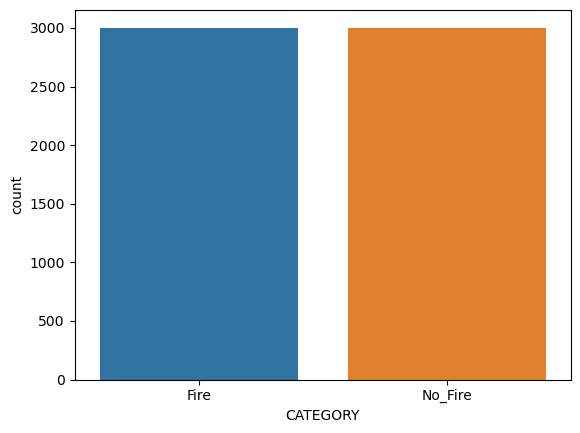

In [54]:
# check impalance in Train data
sns.countplot(Main_Train_Data["CATEGORY"])
plt.show()

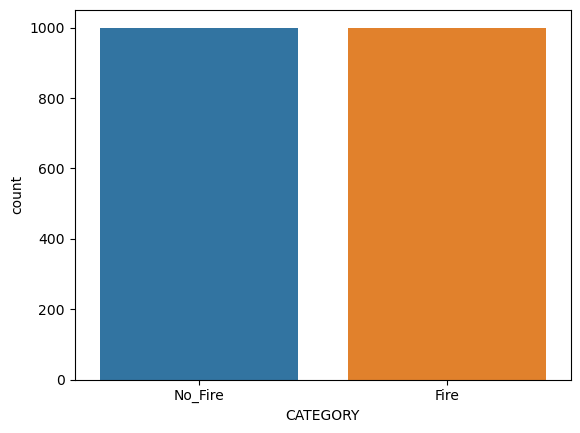

In [55]:
# check impalance in Test data
sns.countplot(Main_Test_Data["CATEGORY"])
plt.show()

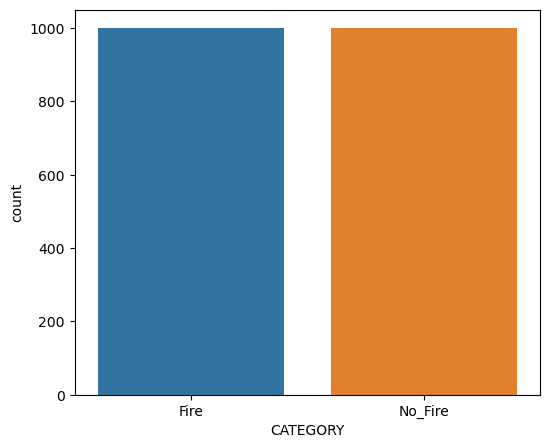

In [80]:
# check impalance in Validation data
fig_dims = (6,5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.countplot(Main_Validation_Data["CATEGORY"])
plt.show()

Text(0.5, 1.0, 'Fire')

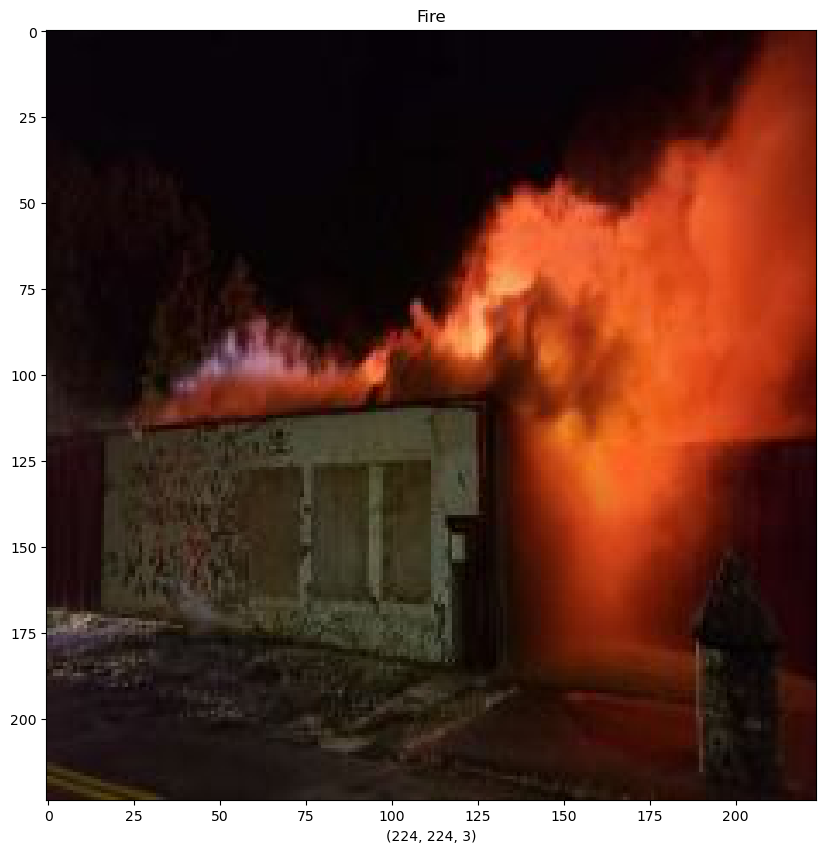

In [57]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Train_Data["JPG"][0])x
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][0])

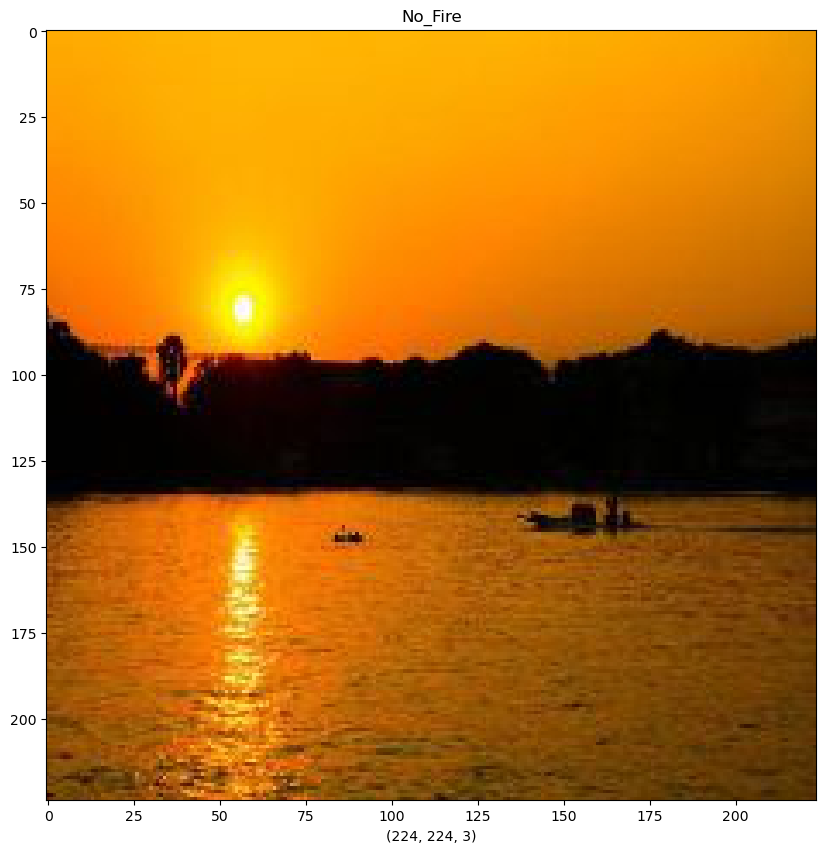

In [58]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Train_Data["JPG"][1888])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][1888])
plt.style.use("default")

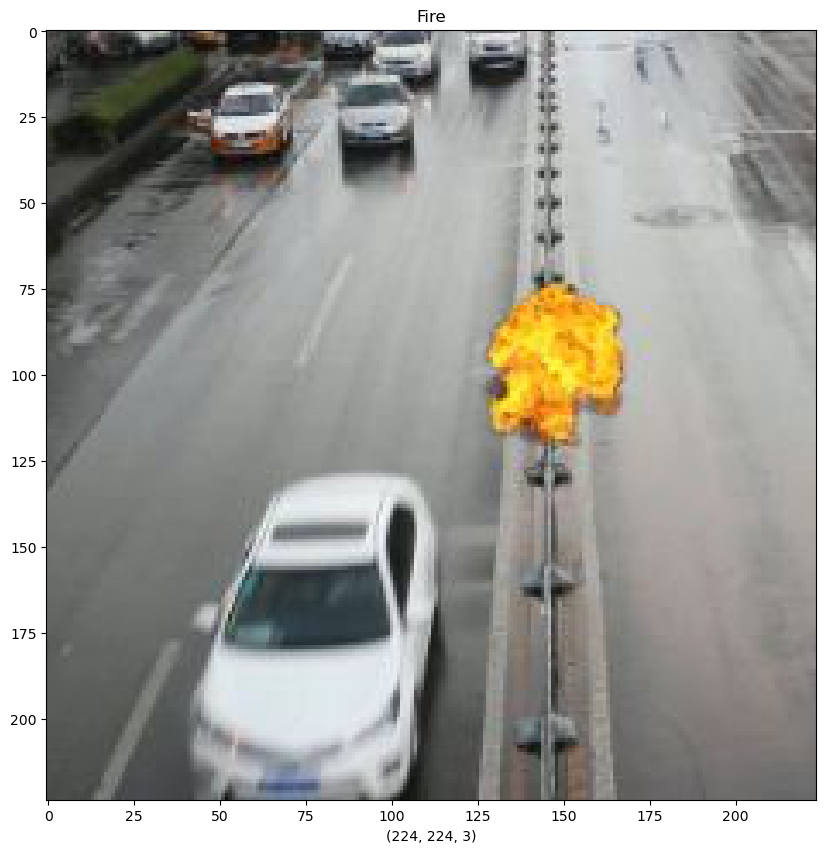

In [59]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Test_Data["JPG"][1005])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Test_Data["CATEGORY"][1005])
plt.style.use("default")

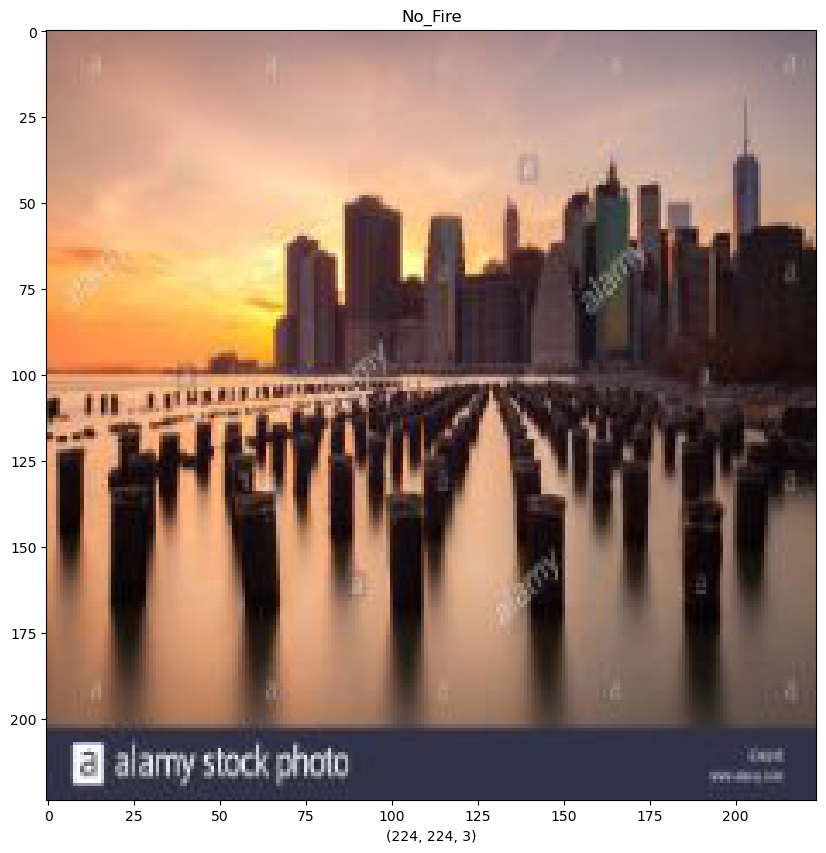

In [60]:
figure = plt.figure(figsize=(10,10))
x = plt.imread(Main_Validation_Data["JPG"][26])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Validation_Data["CATEGORY"][26])
plt.style.use("default")

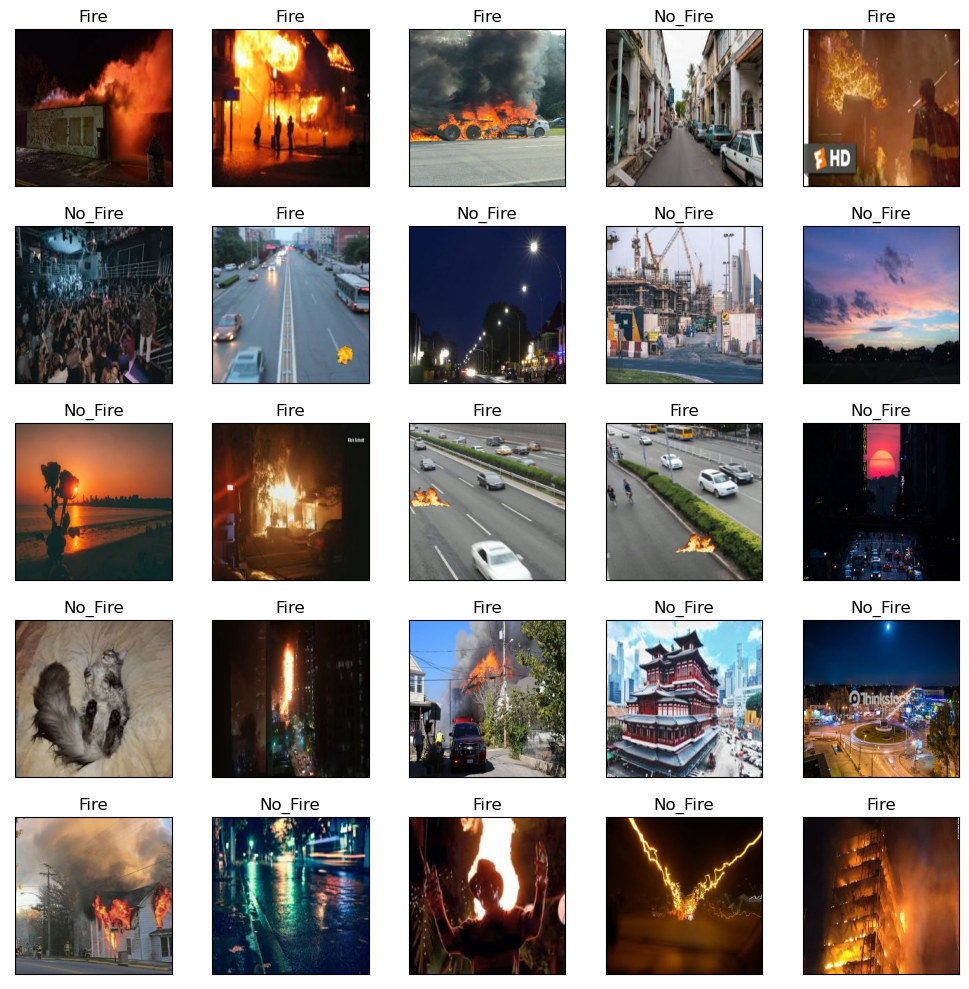

In [61]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(plt.imread(Main_Train_Data["JPG"][i]))
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

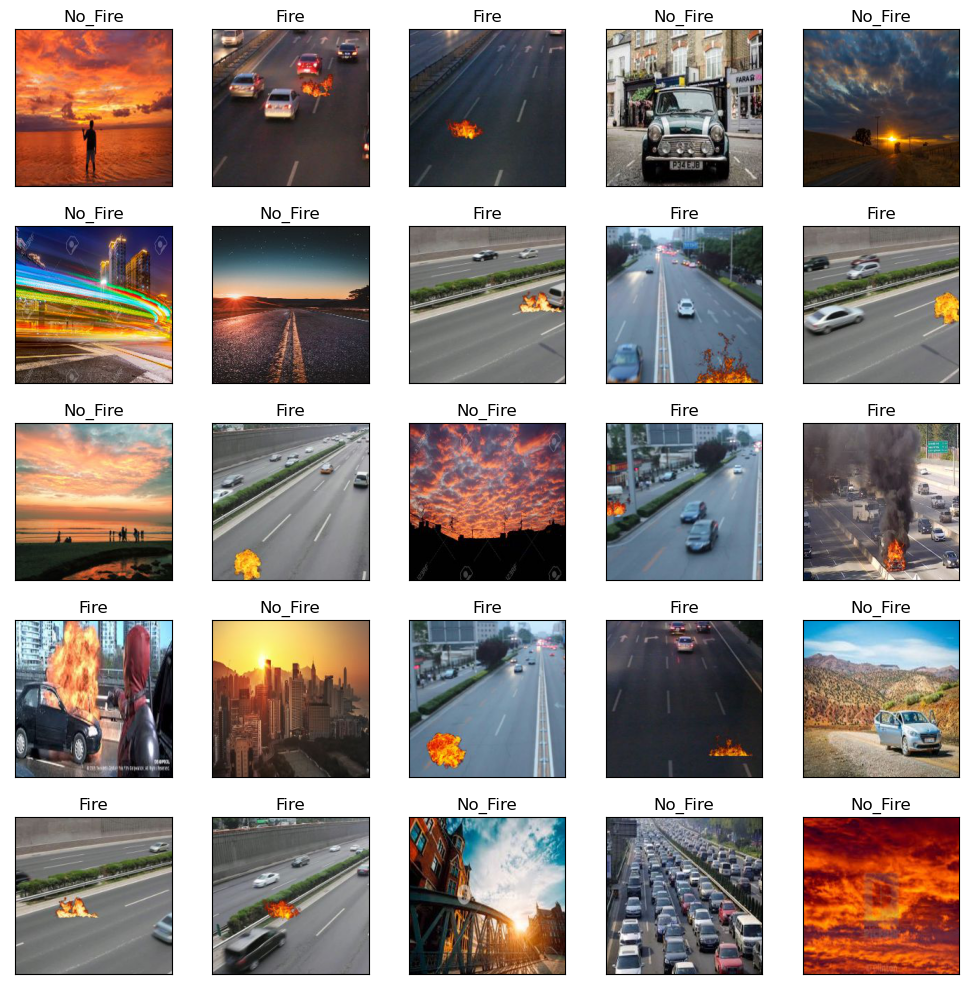

In [62]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(plt.imread(Main_Test_Data["JPG"][i]))
    ax.set_title(Main_Test_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

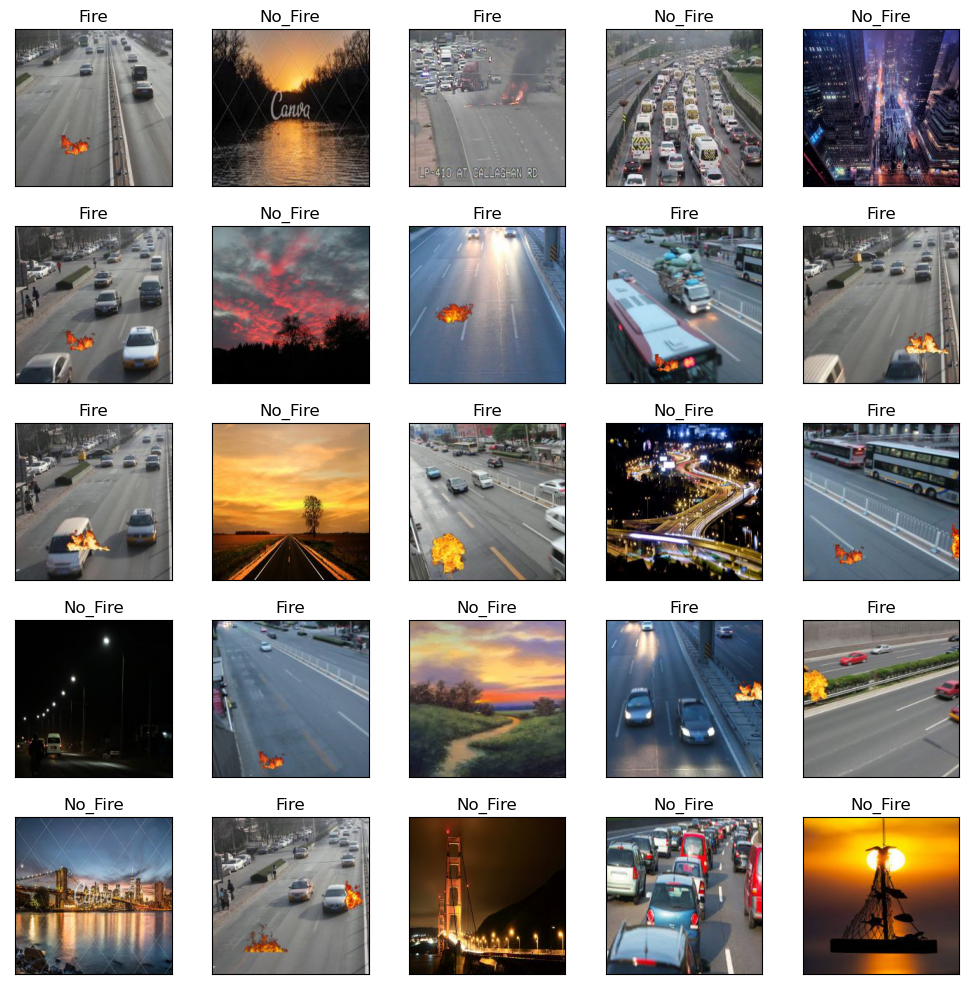

In [63]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(plt.imread(Main_Validation_Data["JPG"][i]))
    ax.set_title(Main_Validation_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

# DETERMINATION TRAIN AND TEST DATA

#### IMAGE GENERATOR

In [64]:
Train_Generator = ImageDataGenerator(rescale=1./255,
                                    zoom_range=0.7,
                                    shear_range=0.7,
                                    rotation_range=50,
                                    horizontal_flip=True,
                                     brightness_range=[0.2,0.9],
                                     vertical_flip=True)

In [65]:
Test_Val_Generator = ImageDataGenerator(rescale=1./255,validation_split=0.5)

#### HOW GENERATOR APPLIED IMAGE LOOK LIKE

In [66]:
example_Image = Main_Train_Data["JPG"][30]
Load_Image = image.load_img(example_Image,target_size=(210,210))
Array_Image = image.img_to_array(Load_Image)
Array_Image = Array_Image.reshape((1,) + Array_Image.shape)

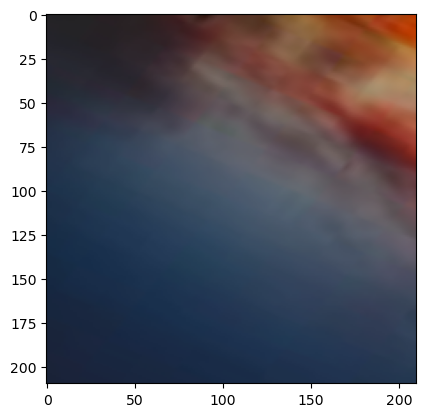

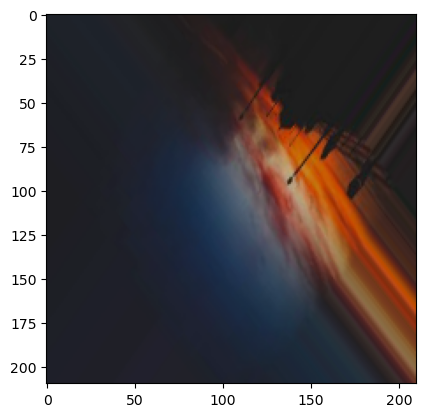

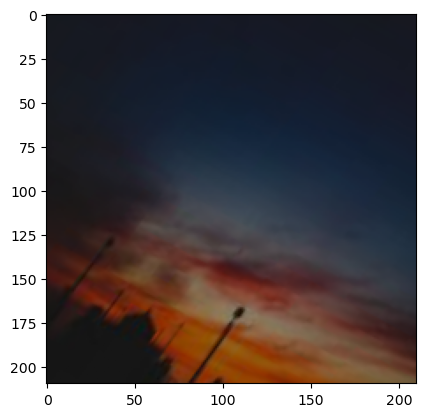

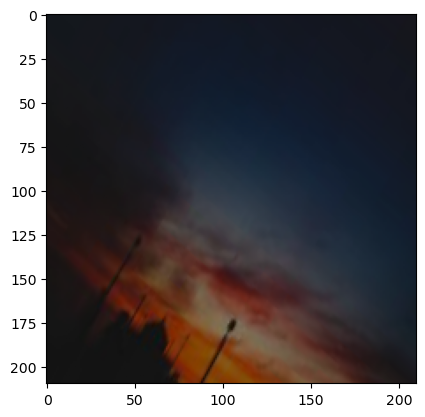

In [67]:
i = 0
for batch in Train_Generator.flow(Array_Image,batch_size=5):
    plt.figure(i)
    Image = plt.imshow(image.img_to_array(batch[0]))
    i += 1
    if i % 4 == 0:
        break
plt.show()

# APPLYING GENERATOR AND TRANSFORMATION TO TENSOR

In [68]:
Train_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Main_Train_Data,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   color_mode="grayscale",
                                                   class_mode="categorical",
                                                   subset="training",
                                                   seed=42,
                                                   batch_size=16)

Found 6003 validated image filenames belonging to 2 classes.


In [69]:
Test_IMG_Set = Test_Val_Generator.flow_from_dataframe(dataframe=Main_Test_Data,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   color_mode="grayscale",
                                                   class_mode="categorical",
                                                   seed=42,
                                                   batch_size=16)

Found 2000 validated image filenames belonging to 2 classes.


In [70]:
Validation_IMG_Set = Test_Val_Generator.flow_from_dataframe(dataframe=Main_Validation_Data,
                                                   x_col="JPG",
                                                   y_col="CATEGORY",
                                                   color_mode="grayscale",
                                                   class_mode="categorical",
                                                      subset="validation",
                                                   seed=42,
                                                   batch_size=16)

Found 1000 validated image filenames belonging to 2 classes.


#### IMAGE SET CHECKING

In [71]:
for data_batch,label_batch in Train_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (16, 256, 256, 1)
LABEL SHAPE:  (16, 2)


In [72]:
for data_batch,label_batch in Validation_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (16, 256, 256, 1)
LABEL SHAPE:  (16, 2)


In [73]:
for data_batch,label_batch in Test_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (16, 256, 256, 1)
LABEL SHAPE:  (16, 2)


In [74]:
print("TRAIN: ")
print(Train_IMG_Set.class_indices)
print(Train_IMG_Set.classes[0:5])
print(Train_IMG_Set.image_shape)
print("---"*20)
print("VALIDATION: ")
print(Validation_IMG_Set.class_indices)
print(Validation_IMG_Set.classes[0:5])
print(Validation_IMG_Set.image_shape)
print("---"*20)
print("TEST: ")
print(Test_IMG_Set.class_indices)
print(Test_IMG_Set.classes[0:5])
print(Test_IMG_Set.image_shape)

TRAIN: 
{'Fire': 0, 'No_Fire': 1}
[0, 0, 0, 1, 0]
(256, 256, 1)
------------------------------------------------------------
VALIDATION: 
{'Fire': 0, 'No_Fire': 1}
[0, 1, 0, 1, 1]
(256, 256, 1)
------------------------------------------------------------
TEST: 
{'Fire': 0, 'No_Fire': 1}
[1, 0, 0, 1, 1]
(256, 256, 1)


#### CALLBACK

In [75]:
Call_Back_Early = tf.keras.callbacks.EarlyStopping(monitor="loss",
                                                   patience=5,
                                                   mode="min")

In [76]:
Call_Back_Check = tf.keras.callbacks.ModelCheckpoint(monitor="val_accuracy",
                                                     save_best_only=True,
                                                     filepath="./my_model")

# Models :

### CNN WITH Conv2D

In [69]:
%mkdir my_model

A subdirectory or file my_model already exists.


In [77]:
Model_One = Sequential()

#
Model_One.add(Conv2D(32,(3,3),activation="relu",
                 input_shape=(256,256,1)))
Model_One.add(MaxPooling2D((2,2)))
Model_One.add(Dropout(0.2))
#
Model_One.add(Conv2D(64,(3,3),activation="relu",
                 strides=(2,2)))
Model_One.add(MaxPooling2D((2,2)))
Model_One.add(Dropout(0.2))
#
Model_One.add(Conv2D(128,(3,3),activation="relu",
                 strides=(2,2)))
Model_One.add(MaxPooling2D((2,2)))
Model_One.add(Dropout(0.2))
#
Model_One.add(Conv2D(128,(3,3),activation="relu",
                 strides=(2,2)))
Model_One.add(MaxPooling2D((2,2)))
Model_One.add(Dropout(0.2))

#
Model_One.add(Flatten())
Model_One.add(Dropout(0.5))
Model_One.add(Dense(512,activation="relu"))
Model_One.add(Dense(2,activation="softmax"))

In [78]:
Model_One.compile(optimizer=RMSprop(lr=0.001),loss="categorical_crossentropy",metrics=["accuracy"])

In [79]:
CNN_Model_One = Model_One.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                            callbacks=[Call_Back_Check,Call_Back_Early],
                      epochs=20)

Epoch 1/20
376/376 [==============================] - 168s 445ms/step - loss: 0.6930 - accuracy: 0.5184 - val_loss: 0.6930 - val_accuracy: 0.5520
Epoch 2/20
376/376 [==============================] - 166s 441ms/step - loss: 0.6853 - accuracy: 0.5576 - val_loss: 0.6657 - val_accuracy: 0.4950
Epoch 3/20
376/376 [==============================] - 165s 439ms/step - loss: 0.6854 - accuracy: 0.5591 - val_loss: 0.6583 - val_accuracy: 0.4950
Epoch 4/20
376/376 [==============================] - 162s 432ms/step - loss: 0.6812 - accuracy: 0.5830 - val_loss: 0.6887 - val_accuracy: 0.4790
Epoch 5/20
376/376 [==============================] - 142s 379ms/step - loss: 0.6829 - accuracy: 0.5729 - val_loss: 0.6702 - val_accuracy: 0.4800
Epoch 6/20
376/376 [==============================] - 144s 382ms/step - loss: 0.6782 - accuracy: 0.5884 - val_loss: 0.6509 - val_accuracy: 0.4920
Epoch 7/20
376/376 [==============================] - 148s 392ms/step - loss: 0.6691 - accuracy: 0.6002 - val_loss: 0.7899 -

In [81]:
Model_Results = Model_One.evaluate(Test_IMG_Set,verbose=False)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

LOSS:  0.5985
ACCURACY:  0.75


No handles with labels found to put in legend.


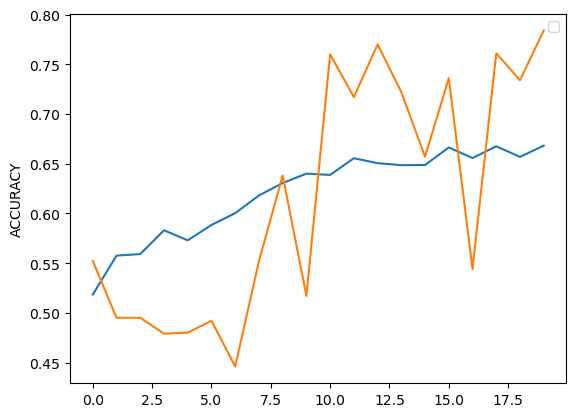

In [82]:
plt.plot(CNN_Model_One.history["accuracy"])
plt.plot(CNN_Model_One.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

<AxesSubplot:>

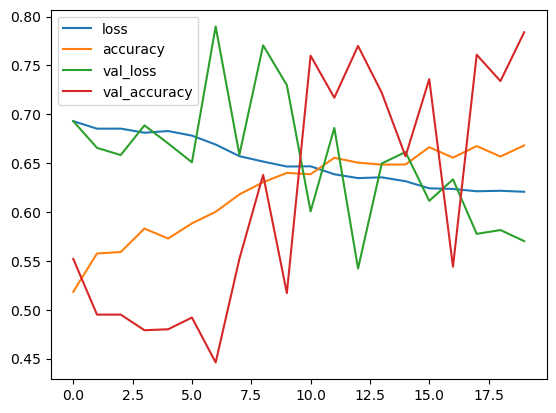

In [83]:
Dict_Summary_One = pd.DataFrame(CNN_Model_One.history)
Dict_Summary_One.plot()

In [84]:
Prediction_One = Model_One.predict(Test_IMG_Set)
Prediction_One = Prediction_One.argmax(axis=-1)

In [85]:
print(Prediction_One)

[1 0 1 ... 1 0 0]


In [2]:
#Model_One.save("models/mobailnetCat2.h5", overwrite=True)

NameError: name 'Model_One' is not defined



### CNN - CRNN

In [94]:
Model_Two = Sequential()

Model_Two.add(Conv2D(12,(3,3),activation="relu",
                 input_shape=(256,256,1)))
Model_Two.add(BatchNormalization())
Model_Two.add(MaxPooling2D((2,2)))

#
Model_Two.add(Conv2D(24,(3,3),
                 activation="relu",padding="same"))
Model_Two.add(Dropout(0.2))
Model_Two.add(MaxPooling2D((2,2)))


#
Model_Two.add(TimeDistributed(Flatten()))
Model_Two.add(Bidirectional(LSTM(32,
                                  return_sequences=True,
                                  dropout=0.5,
                                  recurrent_dropout=0.5)))
Model_Two.add(Bidirectional(GRU(32,
                                  return_sequences=True,
                                  dropout=0.5,
                                  recurrent_dropout=0.5)))

#
Model_Two.add(Flatten())
Model_Two.add(Dense(512,activation="relu"))
Model_Two.add(Dropout(0.5))
Model_Two.add(Dense(256,activation="relu"))
Model_Two.add(Dropout(0.5))
Model_Two.add(Dense(2,activation="softmax"))

In [95]:
Model_Two.compile(optimizer=RMSprop(lr=0.001),loss="categorical_crossentropy",metrics=["accuracy"])

In [102]:
CNN_Model_Two = Model_Two.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                            callbacks=[Call_Back_Check,Call_Back_Early],
                      epochs=20)

Epoch 1/20
376/376 [==============================] - 276s 733ms/step - loss: 0.6629 - accuracy: 0.6340 - val_loss: 1.4985 - val_accuracy: 0.4910
Epoch 2/20
376/376 [==============================] - 277s 736ms/step - loss: 0.6571 - accuracy: 0.6390 - val_loss: 0.4962 - val_accuracy: 0.7710
Epoch 3/20
376/376 [==============================] - 277s 737ms/step - loss: 0.6494 - accuracy: 0.6415 - val_loss: 0.8614 - val_accuracy: 0.4920
Epoch 4/20
376/376 [==============================] - 277s 737ms/step - loss: 0.6598 - accuracy: 0.6285 - val_loss: 0.7638 - val_accuracy: 0.5140
Epoch 5/20
376/376 [==============================] - 277s 736ms/step - loss: 0.6608 - accuracy: 0.6367 - val_loss: 0.7058 - val_accuracy: 0.5270
Epoch 6/20
376/376 [==============================] - 276s 733ms/step - loss: 0.6702 - accuracy: 0.6207 - val_loss: 0.6706 - val_accuracy: 0.6420
Epoch 7/20
376/376 [==============================] - 271s 721ms/step - loss: 0.6675 - accuracy: 0.6299 - val_loss: 0.6032 -

In [103]:
Model_Results_Two = Model_Two.evaluate(Test_IMG_Set,verbose=False)
print("LOSS:  " + "%.4f" % Model_Results_Two[0])
print("ACCURACY:  " + "%.2f" % Model_Results_Two[1])

LOSS:  0.6351
ACCURACY:  0.64


No handles with labels found to put in legend.


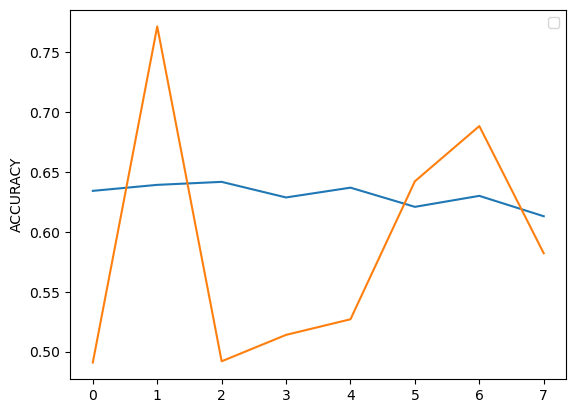

In [104]:
plt.plot(CNN_Model_Two.history["accuracy"])
plt.plot(CNN_Model_Two.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

<AxesSubplot:>

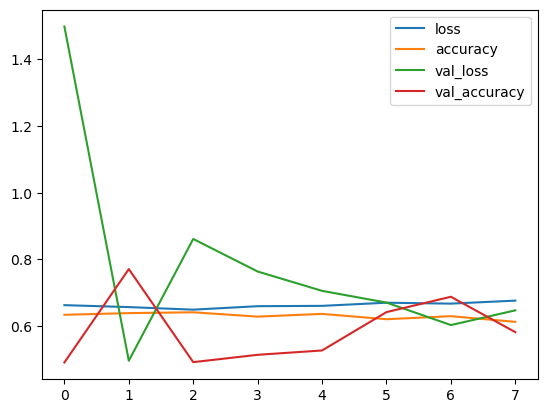

In [105]:
Dict_Summary_Two = pd.DataFrame(CNN_Model_Two.history)
Dict_Summary_Two.plot()

In [106]:
Prediction_Two = Model_Two.predict(Test_IMG_Set)
Prediction_Two = Prediction_Two.argmax(axis=-1)

In [107]:
print(Prediction_Two)

[1 1 1 ... 0 1 1]


### FULLY-CONNECTED

In [108]:
Model_Three = tf.keras.models.Sequential([
  # inputs 
  tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
  tf.keras.layers.Flatten(input_shape=(256,)),
  # hiddens layers
    
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  # output layer
  tf.keras.layers.Dense(2,activation="softmax")
])

In [109]:
Model_Three.compile(optimizer=RMSprop(lr=0.001),loss="categorical_crossentropy",metrics=["accuracy"])

In [110]:
CNN_Model_Three = Model_Three.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                            callbacks=[Call_Back_Check,Call_Back_Early],
                      epochs=20)

Epoch 1/20
376/376 [==============================] - 47s 124ms/step - loss: 0.6870 - accuracy: 0.5402 - val_loss: 0.7802 - val_accuracy: 0.4330
Epoch 2/20
376/376 [==============================] - 47s 124ms/step - loss: 0.6786 - accuracy: 0.5522 - val_loss: 0.7137 - val_accuracy: 0.4020
Epoch 3/20
376/376 [==============================] - 47s 125ms/step - loss: 0.6735 - accuracy: 0.5611 - val_loss: 0.7081 - val_accuracy: 0.4140
Epoch 4/20
376/376 [==============================] - 47s 124ms/step - loss: 0.6736 - accuracy: 0.5609 - val_loss: 0.7208 - val_accuracy: 0.4500
Epoch 5/20
376/376 [==============================] - 47s 125ms/step - loss: 0.6757 - accuracy: 0.5639 - val_loss: 0.7674 - val_accuracy: 0.4520
Epoch 6/20
376/376 [==============================] - 47s 124ms/step - loss: 0.6744 - accuracy: 0.5597 - val_loss: 0.7053 - val_accuracy: 0.4260
Epoch 7/20
376/376 [==============================] - 47s 124ms/step - loss: 0.6712 - accuracy: 0.5737 - val_loss: 0.7986 - val_ac

In [111]:
Model_Prediction_Three = Model_Three.evaluate(Test_IMG_Set,verbose=False)
print("LOSS:  " + "%.4f" % Model_Prediction_Three[0])
print("ACCURACY:  " + "%.2f" % Model_Prediction_Three[1])

LOSS:  0.8596
ACCURACY:  0.47


No handles with labels found to put in legend.


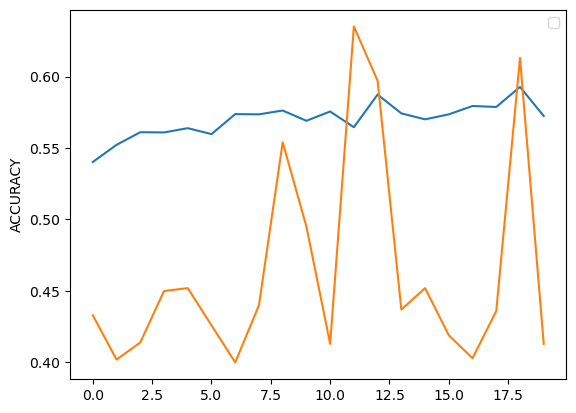

In [112]:
plt.plot(CNN_Model_Three.history["accuracy"])
plt.plot(CNN_Model_Three.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

<AxesSubplot:>

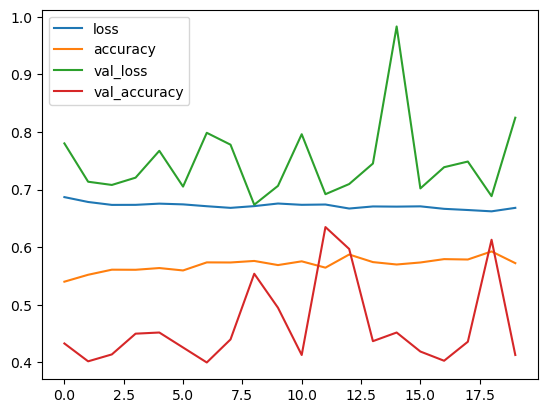

In [113]:
Dict_Summary_Three = pd.DataFrame(CNN_Model_Three.history)
Dict_Summary_Three.plot()

In [114]:
Prediction_Three = Model_Three.predict(Test_IMG_Set)
Prediction_Three = Prediction_Three.argmax(axis=-1)

In [115]:
print(Prediction_Three)

[0 1 1 ... 1 1 1]


# COMMUNITY METHODS

In [116]:
FINAL_PRED = 0.33 * (Prediction_One + Prediction_Two + Prediction_Three)

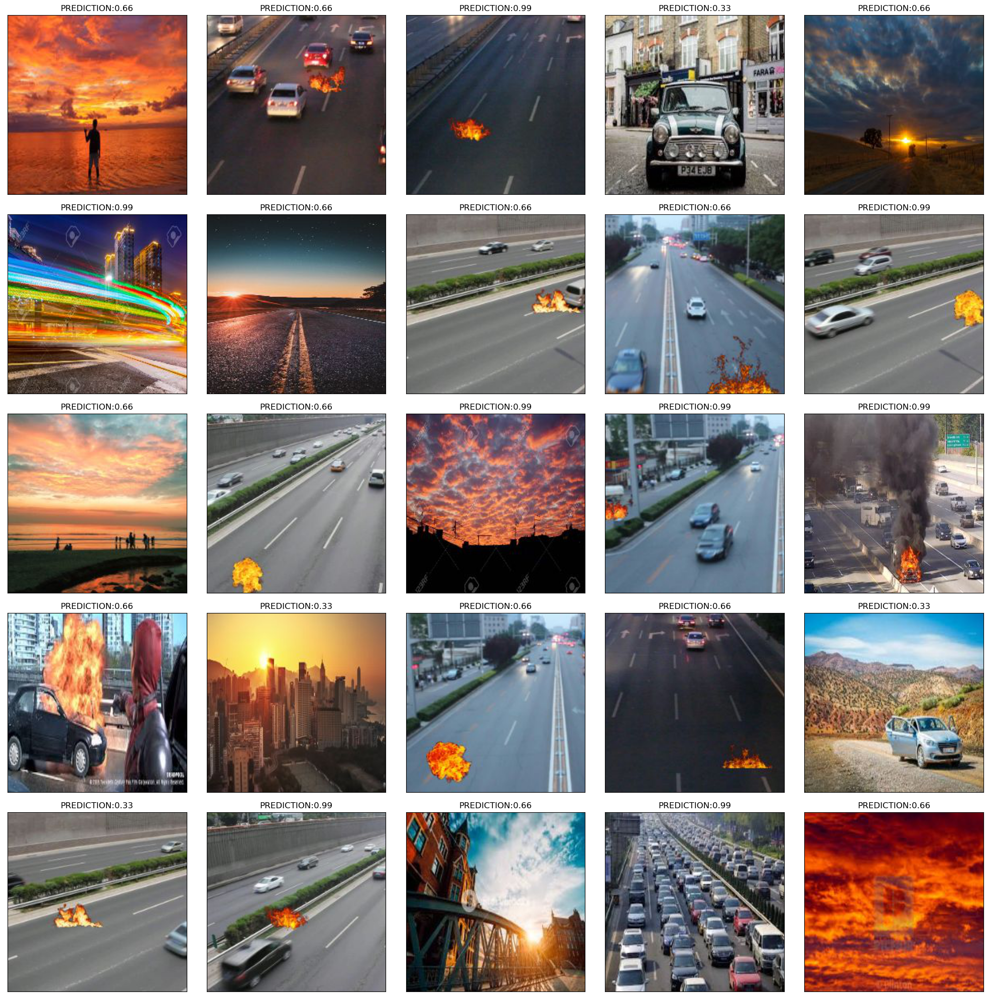

In [117]:
fig, axes = plt.subplots(nrows=5,
                         ncols=5,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(Main_Test_Data["JPG"].iloc[i]))
    ax.set_title(f"PREDICTION:{FINAL_PRED[i]}")
plt.tight_layout()
plt.show()